# Исследование рынка общественного питания Москвы

**Описание проекта:** Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

В работе доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Цели проекта:** подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Задачи проекта:** исследовать данные по всем категориям по Москве и дать рекомендации инвесторам по открытию заведения общественного питания, исследовать данные в категории кофейни дать рекомедации инвесторам по открытию кофени формата кофейни из сериала друзья.

## Общая информация

In [1]:
#импорт необходимых в работе библиотек
import pandas as pd
import re
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster

#сброс ограничений на число столбцов
pd.set_option('display.max_columns', None)

In [2]:
#просмотр исходных данных
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Описание данных:**
- *name* — название заведения;
- *category* — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- *address* — адрес заведения;
- *district* — административный район, в котором находится заведение, например Центральный административный округ;
- *hours* — информация о днях и часах работы;
- *lat* — широта географической точки, в которой находится заведение;
- *lng* — долгота географической точки, в которой находится заведение;
- *rating* — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- *price* — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- *avg_bill* — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 * «Средний счёт: 1000–1500 ₽»;
 * «Цена чашки капучино: 130–220 ₽»;
 * «Цена бокала пива: 400–600 ₽». и так далее;
- *middle_avg_bill* — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
 * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- *middle_coffee_cup* — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
 * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- *chain* — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
 * 0 — заведение не является сетевым
 * 1 — заведение является сетевым
- *seats* — количество посадочных мест.

In [3]:
#просмотрим общую информацию о данных
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод:** в исходных данных находится информация о 8406 заведений. В основном данные в столбцах представлены типа object, также присутствуют данные в формате float: координаты, рейтинг, средний чек и количество посадочных мест, имеется один столбец формата int - сетевое заведение (1) и не сетевое заведение (0). В замене типов данных необходимости нет.

## Предобработка данных

### Наличие пропусков и дубликатов

In [4]:
# проверим наличие пропусков
print(data.isna().sum())
print('-'*30)
# проверим наличие дубликатов
print(f' Всего неявных дубликатов: {data.duplicated().sum()}')
print('-'*30)
#проверим на неявные дубликаты
print(f' Всего неявных дубликатов: {data.duplicated(subset=["name", "address", "category"]).sum()}')

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64
------------------------------
 Всего неявных дубликатов: 0
------------------------------
 Всего неявных дубликатов: 0


### Заполнение пропусков

Заменим пропуски только в столбце с временем работы. Пропуски в других столбцах оставляем, так как заполнять их средними или медианными значениями не корректно. Можно было бы заполнить пропуски в столбце price для тех столбцов, у которых есть информация в avg_bill, но у нас не достаточно данных по каждой категории о том, какой диапазон цен является средним. Аналогично и в другую сторону: нельзя заполнить диапазон цен в avg_bill, так как нет данных что есть среднее. Пропуски middle_avg_bill и middle_coffee_cup не заполняются, так как они взаимоисключающие. Заполнение количества посадочных мест также нельзя провести корректно.

In [5]:
#пропуски в столбце hours
data['hours'] = data['hours'].fillna(value='нет данных')

### Обработка содержания таблицы

In [6]:
#Посмотрим уникальные значения в столбце с категориями заведения и категориями цен
print(data['category'].unique())
print(data['price'].unique())

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']
[nan 'выше среднего' 'средние' 'высокие' 'низкие']


Все в порядке, категории записаны корректно и не дублируют друг друга.

In [7]:
#заменим в столбце chain 1 на сетевое, 0 на несетевое
data['chain'] = data['chain'].replace(1, 'сетевое')
data['chain'] = data['chain'].replace(0, 'несетевое')
data['chain'].unique()

array(['несетевое', 'сетевое'], dtype=object)

In [8]:
#переведем все названия заведений в нижний регистр
data['name'] = data['name'].str.lower()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

[307. 625.]


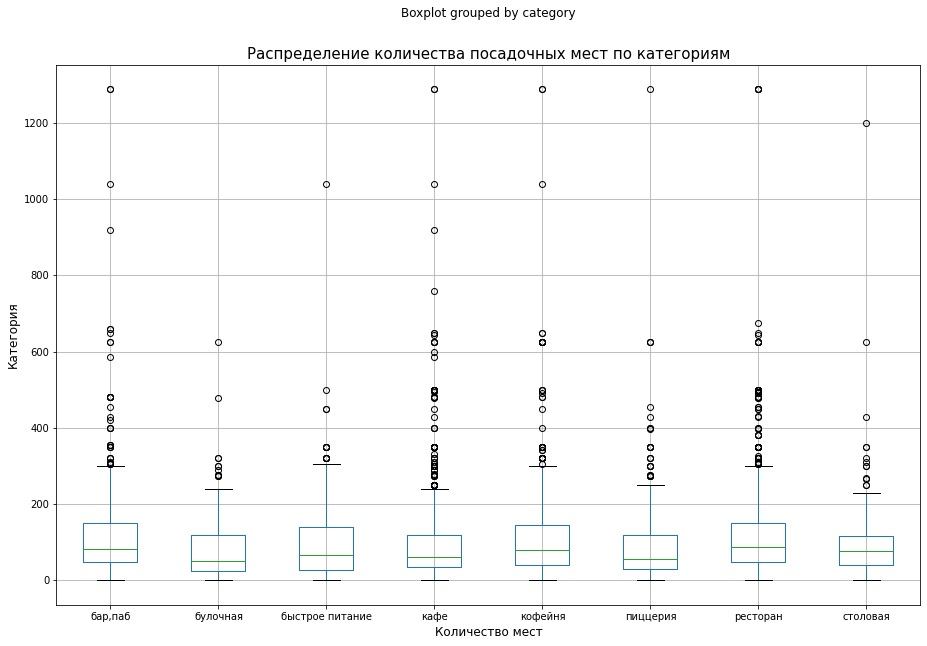

In [9]:
#проверим распределение значений в столбце с колиеством посадочных мест на предмет выбросов
#построим график ящик с усами
data.boxplot(column='seats', by='category', figsize=(15,10))
plt.ylabel('Категория', fontsize=12)
plt.xlabel('Количество мест', fontsize=12)
plt.title('Распределение количества посадочных мест по категориям', fontsize=15)
#выведем основные характеристики распределения
display(data['seats'].describe())
#также посчитаем 95-й и 99-й перцентили
print(np.nanpercentile(data['seats'], [95,99]))

Видно, что в данных имеются выбросы, вероятнее всего это ошибки, так как сложно представить себе заведение с 600+ посадочных мест. Отсечем все лишние значения.

In [10]:
data = data[(data['seats'] < 600)|(data['seats'].isna())]

In [11]:
#еще раз проверим на неявные дубликаты
print(f' Всего неявных дубликатов: {data.duplicated(subset=["name", "address"]).sum()}')

 Всего неявных дубликатов: 3


In [12]:
#появилось четыре дубликата, удалим их
data = data.drop_duplicates(subset=["name", "address"])
print(f' Всего неявных дубликатов: {data.duplicated(subset=["name", "address"]).sum()}')

 Всего неявных дубликатов: 0


### Добавление новых столбцов

Добавим два столбца: street - с названиями улиц, is_24/7 - работает ли заведение круглосуточно или нет.

In [13]:
data['street'] = data['address'].apply(lambda x: re.split(r', ', x)[1])
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

**Вывод:** дубликаты в исходных данных отсутствуют, имеются пропуски в столбцах с часами работы, ценой, средним чеком и количестве посадочных мест. Также есть пропуски в столбцах со средним счетои и средней ценой чашки кофе в связи с особенностью этих данных. Пропуски заполнены только в часах работы на "нет данных". Качественно заполнить пропуски в других столбцах не возможно. Обработано внутреннее содержание таблицы: проверено, что названия категорий заведений и цен не дублируют друг друга, в столбце "chain" единицу заменили на "сетевое", а ноль на "несетевое". Все названия заведений переведены в нижний регистр. После перевода в нижний регистр появилось 4 дубликата по названию и адресу, дубликаты удалены. Отсекли выбросов в столбце с количеством посадочных мест выше 600. Добавили два столбца: название улицы, на которой находится заведение, и информацию о  том, работает ли заведение круглосуточно или нет.

## Анализ данных

### Распределение по категориям

Исследуем количество объектов общественного питания.

In [14]:
#группируем данные по категориям
category_group = data.groupby('category').agg({'name':'count'}).sort_values(by='name', ascending=False).reset_index()
#строим графики
fig = px.bar(category_group, x='category', y='name', title='Распределение по категориям заведений', text = 'name')
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Количество заведений')  
fig.show()

**Вывод:** всего представлено 8 категорий: ресторан, кафе, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная. Самая широкопредставленная категория заведений - кафе, далее идут рестораны и кофейни, меньше всего представлено булочных.

### Количество посадочных мест

Рассмотрим, как распределено количество посадочных мест по категрия после предобработки данных и удаления выбросов свыще 600.

In [15]:
median_seats = data.groupby('category')['seats'].median().reset_index()
#sort_box2 = sort_box.groupby('category')['name'].median().reset_index()
data1 = (
    median_seats.merge(data, 
                       left_on='category', 
                       right_on='category', 
                       suffixes=('_median', ''))
    .sort_values(by='seats_median', ascending=False)
)

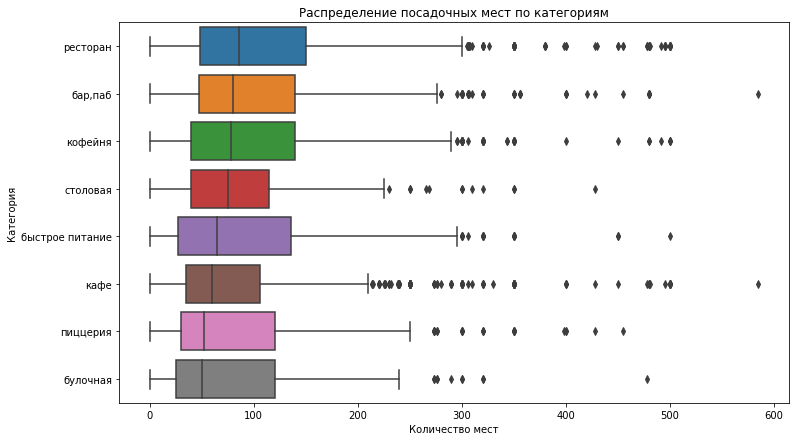

In [16]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='seats', y='category', data=data1)
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('Количество мест')
plt.ylabel('Категория') 
plt.show()

In [17]:
#рассмотрим распределение медианного количества посадочных мест по категориям
category_seats = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats',ascending=False)
fig = px.bar(category_seats, x='category', y='seats', title='Распределение количества посадочных по категориям', text='seats')
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Количество посадочных мест',
                 yaxis_range=[40,90])  
fig.show()

**Вывод:**  Так как в данных присутствуют выбросы, то рассматриваем медианное значение количества посадочных мест. Самое большое количество мест в ресторанах, барах/пабах, кофейнях и столовых, данные форматы заведений предполагают длительное нахождение в них клиентов. Меньше всего посадочных мест в булочных, такой формат зачастую предполагает всего несколько столиков, ведь большинство людей берут продукцию "с собой".

### Соотношение сетевых/несетевых заведений

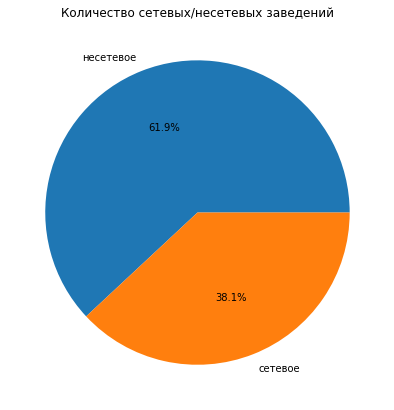

In [18]:
#группируем данные
chain = data.groupby('chain')['name'].count()
#строим график
plt.figure(figsize=(7,7))
chain.plot(kind='pie',y='name',title ='Количество сетевых/несетевых заведений', ylabel = '', autopct='%1.1f%%');


In [19]:
#группируем данные по категориям и считаем долю сетевых заведений в каждой
chain_category = data.query('chain == "сетевое"').groupby('category', as_index=False)['name'].count()
allcategory = data.groupby('category', as_index=False)['name'].count()
total_chain = (
    chain_category.merge(allcategory, 
                         left_on='category', 
                         right_on='category', 
                         suffixes=('_chain', '_total'))
)
total_chain['share'] = round(total_chain['name_chain']/total_chain['name_total'],2)
total_chain = total_chain.sort_values(by='share', ascending=False)

In [20]:
#строим график
fig = px.bar(total_chain, x='category', y='share', title='Распределение доли сетевых заведений по категориям', text='share')
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Доля сетевых',
                 yaxis_range=[0.15,0.65])  
fig.show()

**Вывод:** Более 60% из представленных заведений не являются сетевыми. Выше всего доля сетевых в категории булочных, пиццерий и кофеен. Меньше всего в столовых и барах/пабах.

### Топ-15 сетей в Москве

In [21]:
#создадим отдельную переменную с сетевыми заведениями
chains_1 = data.query('chain == "сетевое"')

In [22]:
#выберем топ-15 из них
big_chain_1 = chains_1.groupby('name', as_index=False)['chain'].count().sort_values(by='chain',ascending = False).head(15)
big_chain_1.head(15)

,name,chain
729,шоколадница,118
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,70
742,яндекс лавка,68
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
628,теремок,38


In [23]:
#проверим на повторы в названиях самых популярных сетей и выведем те, которые дуюлируются
for name in big_chain_1['name']:
    chains_1 = data.loc[data['name'].str.contains(name)]['name'].unique()
    if len(chains_1) > 1:
        print(chains_1)
        print('-'*50)
    else:
        pass

['шоколадница' 'торты от сети кофеен шоколадница']
--------------------------------------------------
['стейки good prime' 'prime' 'prime cafe' 'prime mart']
--------------------------------------------------
['хинкальная' 'бистро хинкальная' 'гемри&эли хинкальная'
 'кафе-хинкальная батоно' 'хинкальная легенда' 'хинкальная кера'
 'мини хинкальная' 'хинкальная на руставели' 'хинкальная jn'
 'хинкальная тбилисо' 'хинкальная в сокольниках'
 'хинкальная москва-тбилиси' 'хинкальная уют' 'хинкальная 11'
 'хинкальная ламазо' 'хинкальная на пресне' 'хинкальная на гоголевском'
 'хинкальная триумф' 'хинкальная № 1' 'хинкальная на арме'
 'хинкальная на спасской' 'хинкальная пирвели' 'хинкальная у бехо'
 'хинкальная 17/1' 'хинкальная 777' 'хинкальная кинза' 'хинкальная № 8'
 'хинкальная ботота' 'хинкальная нагатино' 'хинкальная мегобари'
 'хинкальная экспресс' 'атмосфера хинкальная' 'хинкальная чача'
 'хинкальная рачули' 'хинкальная № 5']
--------------------------------------------------
['чайхан

Группировка происходит в том числе и по таким словам как хинкальная и чайхана, хотя эти заведения не являются единой сетью, исключим их и повторим поиск.

In [24]:
chains_1 = data.query('(chain == "сетевое")&(name != "хинкальная")&(name != "чайхана")')
big_chain_2 = chains_1.groupby('name', as_index=False)['chain'].count().sort_values(by='chain',ascending = False).head(15)
big_chain_2.head(15)

,name,chain
727,шоколадница,118
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,70
740,яндекс лавка,68
58,cofix,65
168,prime,50
409,кофепорт,42
628,теремок,38
418,кулинарная лавка братьев караваевых,38


In [25]:
#проверим на повторы в названиях самых популярных сетей и выведем те, которые дуюлируются
for name in big_chain_2['name']:
    chains_2 = data.loc[data['name'].str.contains(name)]['name'].unique()
    if len(chains_2) > 1:
        print(chains_2)
        print('-'*50)
    else:
        pass

['шоколадница' 'торты от сети кофеен шоколадница']
--------------------------------------------------
['стейки good prime' 'prime' 'prime cafe' 'prime mart']
--------------------------------------------------
['буханка' 'пекарня буханка']
--------------------------------------------------
['кофемания' 'кофемания bez tarelok']
--------------------------------------------------


In [26]:
#теперь заменим некоторые повторы
data['name'] = data['name'].str.replace('торты от сети кофеен шоколадница', 'шоколадница')
data['name'] = data['name'].str.replace('prime cafe', 'prime')
data['name'] = data['name'].str.replace('пекарня буханка', 'буханка')
data['name'] = data['name'].str.replace('кофемания bez tarelok', 'кофемания')

In [27]:
#соберем полученные данные в одну переменную и визуализируем их
chains = data.query('(chain == "сетевое")&(name != "хинкальная")&(name != "чайхана")')
top_chain = chains.groupby('name', as_index=False).agg({'chain':'count', 'category':'first'}).sort_values(by='chain',ascending = False).head(15)

fig = px.bar(top_chain, x='chain', y='name', color='category', title='Топ-15 популярных заведений в Москве по категориям', text='chain') 
fig.update_layout(xaxis_title="Название заведения",
                  yaxis_title="Количество сетей")
fig.show()

**Вывод:** самой распространенной сетью является кофейня шоколадница, за ней следуют две конкурирующие пиццерии: доминос и додо. Такая сеть как яндекс лавка не является полноценным рестораном и работает как даркстор, однако в наших данных она записана именно в эту категорию. В целом большое количество сетей характерно для ресторанов быстрого питания, кофеен и пиццерий. Также в топ входит одна булочная - буханка, которая широко представлена в Москве.

### Представленные районы

In [28]:
print(f'Всего в датасете представлено {data["district"].nunique()} районов: {", ".join(list(data["district"].unique()))}')

Всего в датасете представлено 9 районов: Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Западный административный округ, Центральный административный округ, Восточный административный округ, Юго-Восточный административный округ, Южный административный округ, Юго-Западный административный округ


In [29]:
#сгруппируем данные
dist_cat = data.groupby(['district', 'category'])['name'].count().reset_index()
all_cat = data.groupby('district')['category'].count().reset_index().sort_values(by='category',ascending=False)
distinct_category = all_cat.merge(dist_cat, left_on = 'district', right_on='district')
distinct_category = distinct_category.rename(columns={'category_x':'total_name', 'category_y':'category'})

In [30]:
#построим по ним график
fig = px.bar(
    distinct_category, 
    x='name', 
    y='district',
    color='category', 
    title='Количество заведений каждой категории по районам',
    text='name'
)
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Район',
                  legend_orientation="h")           

fig.show()

**Вывод:** Больше всего заведений представлено в ЦАО, далее идет САО и ЮАО. В ЦАО помимо ресторанов, кафе и кофеин также большую долю занимают бары и пабы, что не характерно для других районов. Соотношение по другим категориям в разных районах похоже между собой.

### Средние рейтинги по категориям заведений

Визуализируем распределение средних рейтингов по категориям заведений и посмотрим сильно ли различаются усреднённые рейтинги в разных типах общепита.

In [31]:
mean_rating = data.groupby('category')['rating'].mean().round(2).reset_index().sort_values(by='rating', ascending = False)
fig = px.bar(mean_rating, x='category', y='rating', title='Средний рейтинг заведений по категориям', text='rating')
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Средний рейтинг',
                 yaxis_range=[4.0,4.5])  
fig.show()

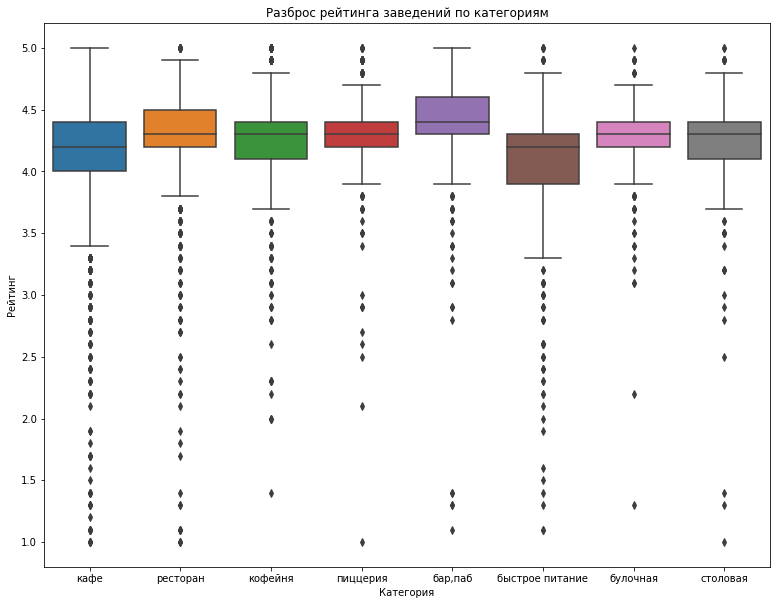

In [32]:
#визуализируем в виде столбчатой диаграмы
plt.figure(figsize=(13,10))
sns.boxplot(data=data, x='category', y='rating')
plt.title('Разброс рейтинга заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг');

**Вывод:** Средний рейтин всех категорий заведений находится в диапазоне 4-4.5. Самый высокий рейтинг у категории бар/паб, самый низкий у быстрого питания. Негативные оценки (меньше 3.5) чаще всего получают рестораны, кафе и быстрое питание, оценку 5.0 чаще всего получают кафе и бары/пабы.

### Хороплет со средним рейтингом заведений кадого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [33]:
#Для каждого района посчитаем средний рейтинг заведений, которые находятся на его территории.
rating_by_district = data.groupby('district', as_index=False)['rating'].mean()

In [34]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самый высокий средний рейтинг у заведений в ЦАО, самый низкий у заведений в ЮВАО.

### Заведения на карте

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [35]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:** Все заведения отражены на карте Москвы в виде кластеров. При увеличении масштаба кластеры автоматически перегруппировываются: при достаточном приближении из кластеров начинают «выпадать» отдельные маркеры с заведениями. При выборе заведения всплывает его название.

### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [36]:
#группируем датасет по улице и считаем количество заведений на каждой, отбираем топ-15
top_streets = data.groupby('street')['name'].count().sort_values(ascending=False).reset_index().head(15) 
#группируем датасет по улице и категории и считаем количество заведений на каждой улице по каждой категории
top_category = data.groupby(['street', 'category'])['name'].count().reset_index()
#из всего списка улиц оставляем только те, которые входят в топ-15 по общему количеству заведений
top15 = top_category[top_category['street'].isin(top_streets['street'])]
top15_street = top_streets.merge(top15, left_on = 'street', right_on='street')
top15_street = top15_street.rename(columns={'name_x':'total_name', 'name_y':'total_category'})
#строим распределение
#построим распределение
fig = px.bar(top15_street, x='street', y='total_category', color='category', title='Топ-15 улиц по количеству заведений', text='total_category')
fig.update_layout(xaxis_title='Улица',
                  yaxis_title='Количество заведений')  
fig.show()

**Вывод:** Больше всего заведений находится на проспекте Мира, Профсоюзной улице и Ленинском проспекте. В рейтинг попали либо очень протяженные шоссе, проспекты и улицы, а также МКАД, либо улицы, на которых стоятбольшие торговые центры, в которых располагается много заведений. Исключением является улица Миклухо-Маклая - она не очень протяженная, на ней нет огромных торговых центров, но большое количество заведений обусловлено небольшим тц у метро и студенческими капусами, в которых располагется много небольших заведений.

### Улицы с одним объектом общепита

Найдем улицы, на которых находится только один объект общепита.

In [37]:
#сохраним первые попадающиеся координаты, чтобы отметить эти улицы на карте
group_street = data.groupby('street').agg({'name':'count', 'lat':'first', 'lng':'first'}).reset_index()
just_one = group_street.query('name == 1')

In [38]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
just_one.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод** Большинство улиц с одним заведением располагается в 'старом' центре Москвы, это можно объяснить тем, что эти улицы очень короткие. Другие улицы находятся в промышленых районах или малопроходимых местах, в таких местах также есть очень короткие улицы.

### Средний чек по районам

Значения средних чеков заведений показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану средних чеков для каждого района. 

In [39]:
#сгруппируем данные по району и медианному среднему чеку
district_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианная стоимость заказа по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самые дорогие заказы ожидаемо приходятся на центр, а также на западный административный округ, который принято считать элитным и дорогим. Самый низкий средний чек наблюдается в ЮАО, ЮВАО и СВАО.

### Зависимость часов работы от местоположения и категории заведений

Посмотрим какая зависимость наблюдается среди заведений, работающих кргулосуточно, в каких районах они преобладают и какие категории чаще представлены в круглосуточных заведениях.

In [40]:
#группируем круглосуточные заведения по району
day_nigth = data[data['is_24/7'] == True].groupby('district')['name'].count().reset_index()
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=day_nigth,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Медианная стоимость заказа по районам',
).add_to(m)

# выводим карту
m

In [41]:
#группируем данные по категориям и считаем количество круглосуточных заведений в каждой
category_allday = data[data['is_24/7'] == True].groupby('category')['name'].count().reset_index()
allday = data.groupby('category')['name'].count().reset_index()
total_allday = (
    category_allday.merge(
    allday, left_on='category', right_on='category', suffixes=('_is24/7', '_total'))
)
total_allday['share'] = round(total_allday['name_is24/7']/total_allday['name_total'],2)
total_allday = total_allday.sort_values(by='share', ascending=False)
#строим график
fig = px.bar(total_allday, x='category', y='share', title='Распределение доли круглосуточных заведений по категориям', text='share')
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Доля круглосуточных',
                 yaxis_range=[0,0.3])  
fig.show()

**Вывод:** Количество круглосуточных заведений по всем категориям очень мало. Выше всего доля круглосуточных заведений у быстрого питания, кафе и булочных. У столовых и кофейнь такие заведения практически отсутствуют.

### Зависимость рейтинга от среднего чека

Посмотрим на зависимость между средним чеком и плохим рейтингом. Для более детальной визуализации ограничем средний чек 3000 рублей, а плохим будем считать рейтинг от 3,5 и ниже.

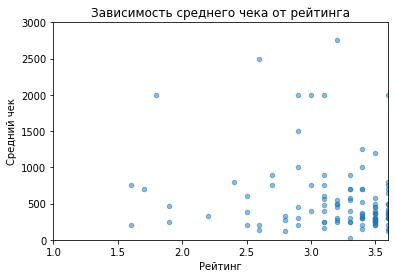

Количество заведений с низким рейтингом: 504
Корреляция между рейтингом и средним чеком: 0.18


In [42]:
ax = data.plot(
    x='rating', 
    y='middle_avg_bill', 
    ylim=(0,3000),
    xlim=(1.0,3.6),
    kind='scatter', alpha=0.5, title='Зависимость среднего чека от рейтинга');
ax.set(xlabel="Рейтинг", ylabel='Средний чек');
plt.show()

print(f'Количество заведений с низким рейтингом: {data[data["rating"] <= 3.5]["name"].count()}')
cor = data['rating'].corr(data['middle_avg_bill'])
print(f'Корреляция между рейтингом и средним чеком: {cor:0.2f}')

In [43]:
low_rating = data[data['rating'] <= 3.5].groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)
fig = px.bar(low_rating, x='category', y='name', title='Распределение заведений с низким рейтингом по категориям', text='name')
fig.update_layout(xaxis_title='Категория',
                  yaxis_title='Количество заведений')  
fig.show()

**Вывод:** больше всего заведений с рейтингом ниже 3.5 представлено в категории кафе, а также в точках быстрого питания и ресторанах. Корреляция между рейтингом и средним чеком не высокая - коэффициент корреляции составляет 0.18.

### Вывод по блоку

- Самые широко представленные категории в датасете - кафе, рестораны и кофейни. Больше всего посадочных мест в ресторанах, барах/пабах, кофейнях и столовых.Такие заведения предпологают более продолжительное нахождение в них клиента, чем форматы быстрого питания, кафе, пиццерии и булочные, где большинство заказов клиенты берут "с собой".
- Сетевые заведения занимают 38.1% от общего количества всех заведений. Больше доля сетевых заведений в категории булочные, пиццерии и кофейни (более 50%).
- Самой популярной является сеть "Шоколадница" (кофейня), за ней следуют "доминос" и "додо" (пиццерии). Больше всего популярных представителей сетей в категории кофейни
- В данных представлено 9 районов Москвы, больше всего заведений находятся в ЦАО, среди них преобладают рестораны, кафе и кофейни, а также бары/пабы
- Средний рейтинг по каждой их категорий находится в диапазоне 4-4.5. Негативную оценку (меньше 3.5) чаще всего получают рестораны, кафе и быстрое питание
- Самый высокий средний рейтинг у заведений в ЦАО, самый низкий - в ЮВАО
- Больше всего заведний также находятся в ЦАО, однако улицы в этом районе не входят в топ-15 улиц по количеству заведений, так они короткие. В топ-15 вошли протяженные улицы, а также улицы, на которых стоят большие ТЦ или есть большое скопление людей (например, студенческие городки на улице Миклухо-Маклая, где преобладают небольшие кафе)
- На небольших центральных улицах часто присутствует лишь одно заведение в силу их длины, такое же явление наблюдается на малопроходимых или улицах, расположившихся в промышленных зонах
- Самый высокий средний чек наблюдается в ЦАО и ЮЗАО, при этом заведения в ЮЗАО не отличаются высоким рейтингом и их среднее значение находится в районе 4.10-4.15
- Круглосуточные заведения - не популярный формат, больше всего круглосуточных заведений в категории быстрое питание (25%), в остальных категориях доля круглосуточных окло 10% и ниже. Круглосуточные заведения сосредоточены в ЦАО.
- Прямой зависимости между рейтингом и средним чеком нет - средний чек до 1000 получает как плохие, так и хорошие оценки. Больше всего заведений с низким рейтингом представлено в категории кафе.


## Исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Количество кофеен и их расположение по районам

Посмотрим сколько кофеен имеется в датасете и в каких районах их больше всего.

In [44]:
cafe = data[data['category'] == 'кофейня']
print(f'Количество кофеен в датасете: {cafe["name"].count()}')

Количество кофеен в датасете: 1401


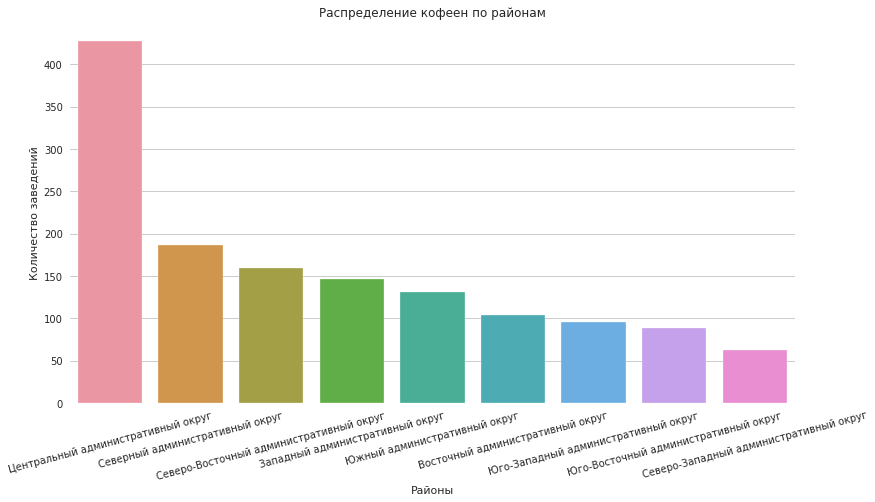

In [45]:
cafe_location = cafe.groupby('district')['name'].count().reset_index().sort_values(by='name', ascending=False)
#построим график
plt.style.use('seaborn') 
sns.set_style('whitegrid') 
plt.figure(figsize=(13,7))
sns.barplot(data=cafe_location, x='district', y='name')
plt.xlabel('Районы')
plt.xticks(rotation=15)
plt.ylabel('Количество заведений')
plt.title('Распределение кофеен по районам');

In [46]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cafe.apply(create_clusters, axis=1)

# выводим карту
m

Всего кофеен 1401 шт, большая часть из них располагается в ЦАО. Аналогичную картину мы наблюдали, когда рассматривали распределение всех категорий заведений по районам. Остальные кофейни располагаются приемущественно в жилых кварталах или вблизи станции метро. Такие заведения расчитаны в основном на жильцов данного микрорайона.

### Круглосуточные кофейни

Рассмотрим распределение круглосуточных кофеен по районам и их долю среди общего числа кофеен.

In [47]:
cafe_allday = cafe[cafe['is_24/7'] == True].groupby('district')['name'].count().reset_index()
all_day = cafe.groupby('district')['name'].count().reset_index()
total_cafe = (
    cafe_allday.merge(
        all_day, left_on='district', right_on='district', suffixes=('_is24/7', '_total'))
)
total_cafe['share'] = round(total_cafe['name_is24/7']/total_cafe['name_total'],2)
total_cafe = total_cafe.sort_values(by='share', ascending=False)
#строим график
fig = px.bar(total_cafe, x='district', y='share', title='Распределение доли круглосуточных кофейн по районам', text='share')
fig.update_layout(xaxis_title='Район',
                  yaxis_title='Доля круглосуточных',
                 yaxis_range=[0,0.08])  
fig.show()
print(f'Общее количество кофеен: {total_cafe["name_total"].sum()}')
print(f'Количество круглосуточных кофеен: {cafe_allday["name"].sum()}')

Общее количество кофеен: 1401
Количество круглосуточных кофеен: 59


Работа кофейни в круглосуточном формате не распространенная практика. Всего в датасете 1401 кофейня, круглосуточных среди них все 59 (4.1%).Выше всего доля круглосуточных кофейн в ЮЗАО (7%), далее идет ЗАО и ЦАО (6%).

### Рейтинги у кофеен

Изучим распределение рейтинга кофеен, а также отобразим значение среднего рейтинга на карте по районам.

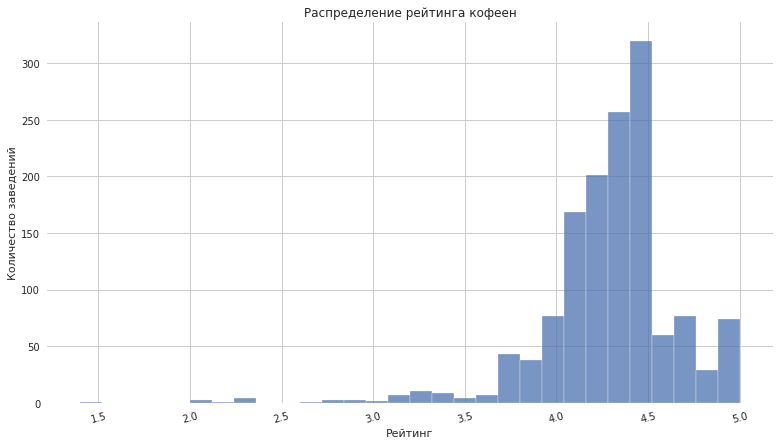

In [48]:
plt.figure(figsize=(13,7))
sns.histplot(cafe['rating'], bins=30);
plt.xlabel('Рейтинг')
plt.xticks(rotation=15)
plt.ylabel('Количество заведений')
plt.title('Распределение рейтинга кофеен');

In [49]:
rating_cafe = cafe.groupby('district', as_index=False)['rating'].mean()
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cafe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Большая часть кофеен в датасете имеет хороший рейтинг от 4 до 4.5. При этом если посмотреть распределение по районам, то самый высокий средний рейтинг у ЦАО и СЗАО, а самый низкий у ЗАО и СВАО, а сами значения рейтингов входят в даипазон от 4.19 до 4.22.

### Стоимость чашки кофе

In [50]:
coffee_cup = cafe.groupby('district')['middle_coffee_cup'].mean().round(2).reset_index().sort_values(by='middle_coffee_cup', ascending=False)
fig = px.bar(coffee_cup, x='district', y='middle_coffee_cup', title='Средняя стоимость чашки кофе по районам', text='middle_coffee_cup')
fig.update_layout(xaxis_title='Район',
                  yaxis_title='Средняя стоимость',
                 yaxis_range=[145,190])  
fig.show()
print(f'Средняя стоимость чашки кофе по Москве: {cafe["middle_coffee_cup"].mean().round(2)}')

Средняя стоимость чашки кофе по Москве: 175.06


**Вывод:** Средняя стоимость чашки кофе по Москве: 175 рублей. Самая большая средняя стоимость в ВАО, самая маленькая в ЮВАО.

### Топ-15 улиц по количеству кафе и улицы с одним заведением

In [51]:
#группируем датасет по улице и считаем количество заведений на каждой, отбираем топ-15
top_streets_cafe = cafe.groupby('street').agg({'name':'count', 'lat':'first', 'lng':'first'}).sort_values(by='name', ascending=False).reset_index() 
#построим распределение
fig = px.bar(top_streets_cafe.head(15), x='street', y='name', title='Топ-15 улиц по количеству заведений', text='name')
fig.update_layout(xaxis_title='Улица',
                  yaxis_title='Количество заведений')  
fig.show()

In [52]:
#группируем датасет по улице и считаем количество заведений на каждой, отбираем топ-15
just_one_cafe =  top_streets_cafe.query('name == 1')
print(f'Всего улиц с 1 кафе: {just_one_cafe.shape[0]}')

Всего улиц с 1 кафе: 371


In [53]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']}",
    ).add_to(marker_cluster)

just_one_cafe.apply(create_clusters, axis=1)

m

**Вывод:** топ-15 улиц по количеству кафе похоже на топ-15 улиц по общему количеству заведений, по большей части это большие пропекты и шоссе. Всего улиц, где расположено всего одно кафе в датасете 371, большая часть из них - центральные улицы.

### Распределение количества посадочных мест в кофейнях

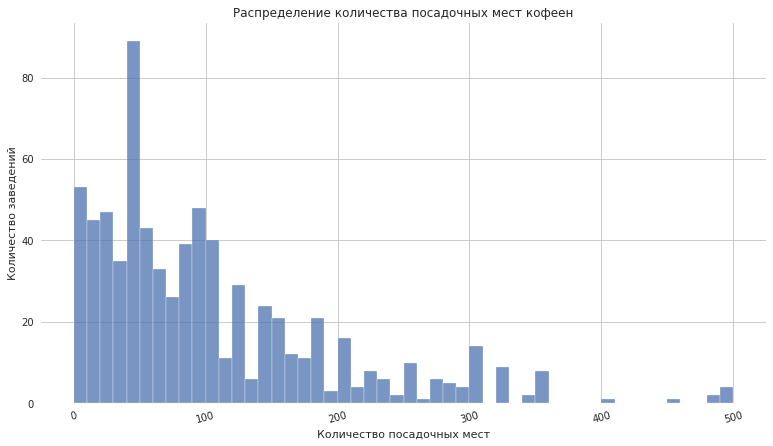

In [54]:
plt.figure(figsize=(13,7))
sns.histplot(cafe['seats'], bins=50);
plt.xlabel('Количество посадочных мест')
plt.xticks(rotation=15)
plt.ylabel('Количество заведений')
plt.title('Распределение количества посадочных мест кофеен');

**Вывод:** Основная масса кофеен вмещает в себя до 100 человек.

### Вывод и рекомедации по открытию кофейни.

- Всего в Москве открыто 1401 кофеен, большая часть из них находится в ЦАО (более 500), меньше всего в СЗАО (менее 100).
- Из 1401 кофеен круглосуточно работает всего 59 (4.1%). Больше всего круглосуточных кофеен в ЮЗАО, ЗАО и ЦАО.
- Большинство кофеен имеет рейтинг от 4.0 до 4.5, самый высокий в ЦАО и СЗАО, самый низкий в СВАО и ЮЗАО.
- Средняя стоимость чашки кофе по Москве 175 рублей, в ВАО, ЮЗАО, ЦАО и ЗАО она выше средней, в остальных округах ниже.
- Больше всего кофеен располагаетс на протяженных улицах и улицах с большими торговыми точками (например, на Новодмитровской находится культурный центр Хлебзавод №9, в котором располагается несколько кофеен, что выводит короткую Новодмитровскую улицу в топ-15).
- Основная часть кофеен вмещает в себя до 100 человек.

Для открытия а-ля «Central Park» кофейни в Москве необходимо учитывать общую проходимость в районе. Для этого подошел бы ЦАО (в пределах ТТК), несмотря на большое количество уже имеющихся в нем заведений: в среднем у этих заведений высокий рейтинг и высокий средний чек. Другие районы я бы не рекомендовала рассматривать, так как заведения в них расчитаны в основном на проживающих в них людей, а не на массовую узнаваемость. В ЦАО много небольших "свободных" улиц в пределах Садового кольца (например, Новая площадь, Неглинная, Никитский переулок, Воздвиженка), можно расположить кофейню там. Учитывая популярность сериала, также можно расположить кофейню на популярных туристических улицах (Никольская, Тверская, Арбат), не боясь конкуренции, т.к. такой формат достаточно уникален. Также кофейню можно сделать в круглосуточном формате, т.к. доля таких заведений очень не велика и в ЦАО она составляет всего 6% от всей массы кофеен. Чтобы привлечь еще больше посетителей, среднюю цену чашки кофе в такой кофейне можно сделать примерно равной средней по Москве (175 рублей), так, она будет ниже, чем средняя цена по ЦАО (187 рублей).

## Рекомендации по открытию заведения общественного питания в Москве

Так как заказчики решили попробовать себя в новой области и открыть заведение общественного питания, то для начала необходимо определиться с категорией заведения. Конкурировать с сетевиками сложнее, поэтому отсекаем булочные, пиццерии, кофейни и быстрое питание. Рассмотрим рестораны, кафе, столовые и бары/пабы.

Среди этих категорий можно выбрать "среднее" заведение по количеству посадочных мест: слишком много посадочных мест это достаточно затратно, а с малым количеством мест сложнее выходить на окупаемость. Поэтому выбираем столовые или кафе.

Если рассмотреть топ-15 сетей по Москве, то это заведения категорий ресторан, пиццерия, кофейня, кафе, булочная. А вот категории столовая, бар и быстрое питание в них не входят, среди первых двух этих категорий сетевые практически не встречаются, конкуренция в них не большая. Обратим внимание на эти две категории в дальнейшем.

По расположению самый популярный район - ЦАО, конкуренция там высока, поэтому лучше обратить внимание на другие районы, например, СЗАО или ЮВАО, в этих районах меньше всего заведений, а доля баров и столовых также не высока. Также можно обратить внимание на ЗАО и ЮЗАО, категория столовые там также не представлена, а эти районы славятся большим количеством учебных заведений и такой формат был бы там очень популярен.

Также категория столовые обладает весьма неплохим средним рейтингом 4.21 , большая часть заведений имеет рейтинг выше 4.0, при этом заведений с рейтингом от 4,8 все пару штук. При создании качественного заведения можно рассчитывать на высокий рейтинг, что принесет популярность и поток клиентов. Тем более, что средний рейтинг всех заведения по этим районам 4.15-4.19, конкурировать в них легче.

По месторасположению можно рассмотреть улицы, на которы количество заведений мало, но при этом они находятся рядом с большими университетами или станциями метро (Николая Коперника у МГУ, Винницкая улица у метро Раменки, улица Лобачевского у МГИМО).

В пользу выбора ЗАО и ЮЗАО говорит еще и средний чек. В ЗАО средний чек сравним с ЦАО (от 908 до 1000 рублей), в ЮЗАО он ниже(от 542 до 633), но не самый маленький в сравнении с другими районами.

Круглосуточных заведений в этих районах не много, но для категории столовой такой формат не является необходимостью, хотя конкуренции среди круглосуточных столовых немного (всего 4% от общего количества работают в таком режиме).